The Santa Barbara scene, taken on the years 2013 and 2014 with the AVIRIS sensor over the Santa Barbara region (California) whose spatial dimensions are 984 x 740 pixels and includes 224 spectral bands.

- barbara_2013.mat: 		original image.			740x984x224 

- barbara_2014.mat:		changed image.			740x984x224 

- barbara_gtChanges.mat:	reference data of changes.	740x984x1 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [2]:
from scipy.io import loadmat
barbara= loadmat('barbara_2013.mat')

In [3]:
barbara.keys()

dict_keys(['__header__', '__version__', '__globals__', 'HypeRvieW'])

In [4]:
barbara = barbara['HypeRvieW']
barbara.shape

(984, 740, 224)

In [5]:
type(barbara)

numpy.ndarray

In [6]:
#barbara[:,:,0].shape表示对barbara数组进行索引，取出所有行和列，并且只保留通道为0的那一层。.shape是用来获取数组的形状的属性。
#具体地，barbara[:,:,0]将返回一个新的数组，它只包含barbara数组的第一个通道的所有元素。然后，.shape将返回这个新数组的形状。
barbara[:,:,0].shape

(984, 740)

In [7]:
#找到数组中的最大值
barbara.max()

36572.0

In [8]:
barbara.min()

-124.0

In [9]:
barbara

array([[[ 5.888e+03,  5.448e+03,  4.968e+03, ...,  1.800e+01,
          2.000e+00,  6.000e+00],
        [ 6.128e+03,  5.608e+03,  5.088e+03, ...,  2.000e+01,
          2.000e+00,  6.000e+00],
        [ 6.212e+03,  5.632e+03,  5.128e+03, ...,  3.800e+01,
          9.000e+00,  9.000e+00],
        ...,
        [ 6.716e+03,  6.128e+03,  5.468e+03, ...,  4.900e+01,
          1.200e+01,  1.000e+01],
        [ 6.608e+03,  5.976e+03,  5.464e+03, ...,  5.200e+01,
          1.100e+01,  1.600e+01],
        [ 6.792e+03,  6.120e+03,  5.544e+03, ...,  5.100e+01,
          1.100e+01,  9.000e+00]],

       [[ 6.124e+03,  5.700e+03,  5.092e+03, ...,  1.700e+01,
          3.000e+00,  3.000e+00],
        [ 6.104e+03,  5.664e+03,  5.084e+03, ...,  2.100e+01,
          3.000e+00,  5.000e+00],
        [ 6.212e+03,  5.688e+03,  5.244e+03, ...,  3.800e+01,
          1.000e+01,  9.000e+00],
        ...,
        [ 6.716e+03,  6.052e+03,  5.528e+03, ...,  4.900e+01,
          1.200e+01,  1.000e+01],
        [ 6.

In [10]:
barbara_gt = loadmat('barbara_gtChanges.mat')
print(barbara_gt.keys())

dict_keys(['__header__', '__version__', '__globals__', 'HypeRvieW'])


In [11]:
barbara_gt = barbara_gt['HypeRvieW']
barbara_gt.shape

(984, 740)

In [12]:
barbara_gt

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [13]:
np.unique(barbara_gt)

array([0, 1, 2], dtype=uint8)

In [14]:
df_barbara_gt = pd.DataFrame(barbara_gt)
df_barbara_gt

,0,1,2,3,4,5,6,7,8,9,...,730,731,732,733,734,735,736,737,738,739
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
979,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
980,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
981,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
982,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [15]:
df_barbara_gt.to_csv("df_barbara_gt.csv", index = False)

In [16]:
barbara_gt.ravel().shape

(728160,)

# 读取数据

In [17]:
X = barbara
y = barbara_gt
print(f"X shape: {X.shape}\ny shape: {y.shape}")

X shape: (984, 740, 224)
y shape: (984, 740)


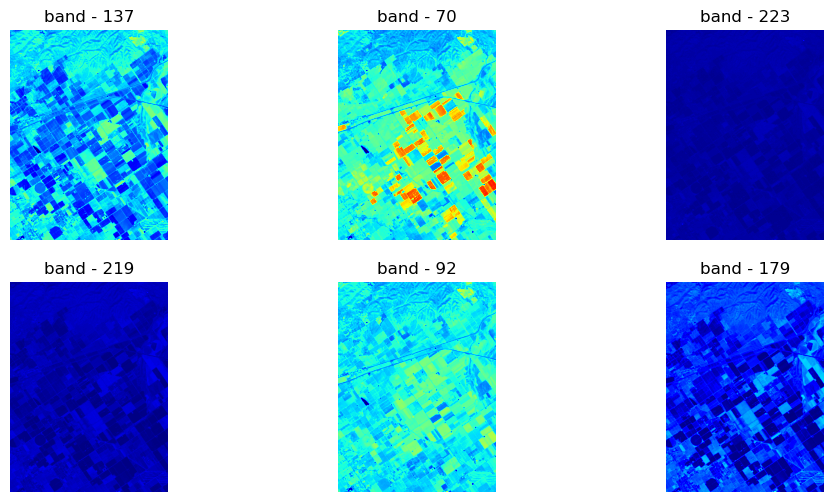

In [18]:
#随机生成波段，并展示该波段的图像
import seaborn as sns
sns.axes_style('whitegrid')
fig = plt.figure(figsize=(12, 6))

for i in range(1, 1+6):
    fig.add_subplot(2, 3, i)
    q = np.random.randint(X.shape[2])
    plt.imshow(X[:, :, q], cmap='jet')
    plt.axis('off')
    plt.title(f'band - {q}')

In [19]:
!pip install plotly
import plotly.express as px

#Plotly是一个用于创建交互式可视化图表的Python库。它提供了多种图表类型和丰富的配置选项，使用户能够创建高质量、可交互的图表和数据可视化。

cls = px.imshow(y, color_continuous_scale='jet')

#jet颜色连续比例尺在数据可视化中常用于表示数值的大小或强度。
#一些常用比例尺：jet viridis plasma inferno magma coolwarm

cls.update_layout(title='Ground Truth', coloraxis_showscale=True)
cls.update_xaxes(showticklabels=False)
cls.update_yaxes(showticklabels=False)
cls.show()

### 将图像转化为CSV存储

In [20]:
def extract_pixels(X, y, save_name='barbara_all'):
    q = X.reshape(-1, X.shape[2])
    df = pd.DataFrame(q)
    df = pd.concat([df, pd.DataFrame(y.ravel())], axis=1)
    df.columns= [f'band{i}' for i in range(1, 1+X.shape[2])]+['class']
    df.to_csv(f'dataset/{save_name}.csv', index=False)
    
    return df

#将X数组重新整形为一个二维数组，其中第一维表示像素点的数量，第二维表示每个像素点的波段值。

In [21]:
df = extract_pixels(X, y, save_name='barbara_all')
df
#提取的像素数据会被赋值给变量 df，成为一个DataFrame对象

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band216,band217,band218,band219,band220,band221,band222,band223,band224,class
0,5888.0,5448.0,4968.0,5764.0,7644.0,7756.0,7276.0,7068.0,7920.0,8256.0,...,52.0,80.0,60.0,40.0,45.0,35.0,18.0,2.0,6.0,0
1,6128.0,5608.0,5088.0,5884.0,7688.0,7800.0,7336.0,7128.0,7964.0,8328.0,...,67.0,95.0,76.0,48.0,56.0,40.0,20.0,2.0,6.0,0
2,6212.0,5632.0,5128.0,5940.0,7848.0,8200.0,7640.0,7544.0,8564.0,9080.0,...,107.0,166.0,124.0,82.0,99.0,73.0,38.0,9.0,9.0,0
3,6212.0,5632.0,5128.0,5940.0,7848.0,8200.0,7640.0,7544.0,8564.0,9080.0,...,107.0,166.0,124.0,82.0,99.0,73.0,38.0,9.0,9.0,0
4,6068.0,5688.0,5180.0,5992.0,8052.0,8292.0,7836.0,7716.0,8716.0,9232.0,...,115.0,175.0,131.0,80.0,106.0,80.0,38.0,4.0,7.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
728155,6368.0,5584.0,5156.0,5804.0,7604.0,7616.0,6936.0,6684.0,7356.0,7528.0,...,22.0,37.0,28.0,20.0,26.0,16.0,10.0,0.0,4.0,0
728156,6368.0,5584.0,5156.0,5804.0,7604.0,7616.0,6936.0,6684.0,7356.0,7528.0,...,22.0,37.0,28.0,20.0,26.0,16.0,10.0,0.0,4.0,0
728157,6276.0,5660.0,5132.0,5772.0,7548.0,7572.0,6992.0,6696.0,7324.0,7476.0,...,19.0,34.0,27.0,13.0,21.0,12.0,6.0,2.0,3.0,0
728158,6308.0,5716.0,5196.0,5768.0,7620.0,7600.0,7012.0,6708.0,7380.0,7508.0,...,20.0,32.0,29.0,11.0,19.0,16.0,7.0,1.0,0.0,0


In [22]:
df.info()
#打印出DataFrame的基本信息，包括每列的名称、数据类型和非空值数量等

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 728160 entries, 0 to 728159
Columns: 225 entries, band1 to class
dtypes: float64(224), uint8(1)
memory usage: 1.2 GB


In [23]:
df.iloc[:, :-1].describe()
#对DataFrame对象 df 进行切片操作，选择除了最后一列之外的所有列。
#.describe() 是DataFrame对象的一个方法，用于生成关于数据的统计描述信息。

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band215,band216,band217,band218,band219,band220,band221,band222,band223,band224
count,728160.000000,728160.000000,728160.000000,728160.000000,728160.000000,728160.000000,728160.000000,728160.000000,728160.000000,728160.000000,...,728160.000000,728160.000000,728160.000000,728160.000000,728160.00000,728160.000000,728160.000000,728160.000000,728160.000000,728160.000000
mean,6519.389986,5922.481356,5400.763255,6199.304625,8243.835921,8413.936036,7860.393485,7692.895754,8608.509674,9011.124149,...,150.996107,103.749072,154.295027,119.082844,75.32095,96.287107,74.274291,37.290365,6.958391,8.393334
std,326.476512,311.974458,306.764584,395.550772,600.258338,707.195823,752.983761,846.387949,1070.280604,1243.418696,...,78.981885,54.818257,81.739895,62.460514,38.82979,50.149047,40.369324,20.509484,4.705451,5.301026
min,5596.000000,5112.000000,4676.000000,5380.000000,7172.000000,7216.000000,6612.000000,6312.000000,6848.000000,6936.000000,...,2.000000,0.000000,3.000000,0.000000,0.00000,0.000000,0.000000,-2.000000,-12.000000,-7.000000
25%,6304.000000,5720.000000,5188.000000,5900.000000,7776.000000,7860.000000,7272.000000,7028.000000,7764.000000,8028.000000,...,82.000000,58.000000,83.000000,65.000000,42.00000,52.000000,39.000000,20.000000,3.000000,4.000000
50%,6496.000000,5888.000000,5360.000000,6152.000000,8180.000000,8344.000000,7792.000000,7620.000000,8528.000000,8924.000000,...,165.000000,112.000000,168.000000,125.000000,82.00000,101.000000,80.000000,40.000000,6.000000,9.000000
75%,6700.000000,6092.000000,5564.000000,6412.000000,8564.000000,8792.000000,8264.000000,8152.000000,9192.000000,9700.000000,...,210.000000,142.000000,214.000000,166.000000,103.00000,129.000000,103.000000,53.000000,11.000000,11.000000
max,9796.000000,9704.000000,9824.000000,12712.000000,18796.000000,22628.000000,22968.000000,23832.000000,28040.000000,30608.000000,...,2304.000000,1745.000000,2593.000000,2126.000000,1607.00000,2244.000000,2006.000000,1330.000000,436.000000,489.000000


## PCA

由于HSI数据集具有较高的维度，因此难以处理庞大的数据。 因此，使用主成分分析（PCA）将数据的维数缩减为3D，这是一种流行且广泛使用的降维技术。 以下代码用于将数据集的尺寸减少为三个。

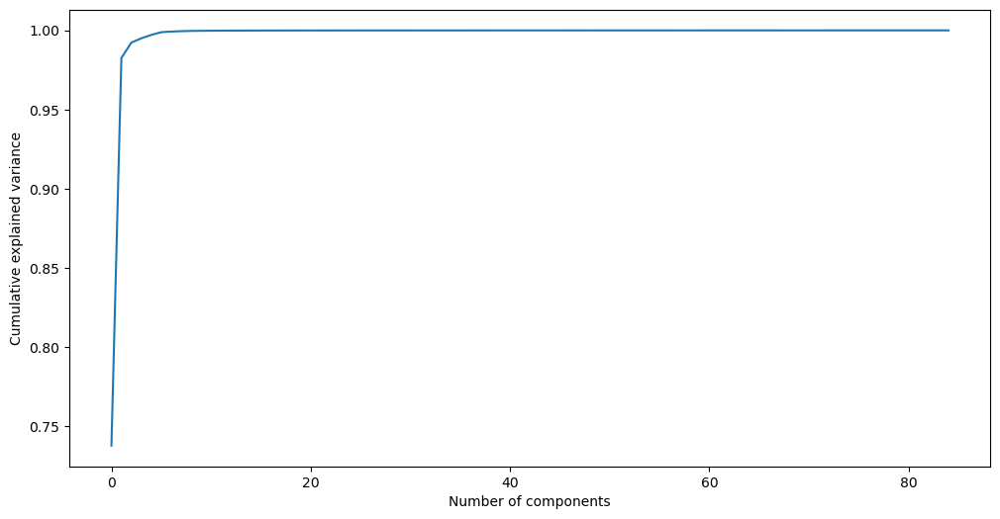

In [24]:
from sklearn.decomposition import PCA

pca_components = 85

pca = PCA(n_components = pca_components)
data = df.iloc[:, :-1].values
dt = pca.fit_transform(data)

ev=pca.explained_variance_ratio_

plt.figure(figsize=(12, 6))
plt.plot(np.cumsum(ev))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

plt.show()

#使用matplotlib库绘制了一个图表，图表的横坐标是主成分的数量，纵坐标是累计解释方差的比例。
#通过plt.plot(np.cumsum(ev))绘制了累计解释方差的比例曲线。
#np.cumsum(ev)是将每个主成分的方差比例进行累积求和。plt.xlabel('Number of components')和plt.ylabel('Cumulative explained variance')设置了横坐标和纵坐标的标签。

In [25]:
pca_components = 40

pca = PCA(n_components = pca_components)
dt = pca.fit_transform(df.iloc[:, :-1].values)
q = pd.concat([pd.DataFrame(data = dt), pd.DataFrame(data = y.ravel())], axis = 1)
q.columns = [f'PC-{i}' for i in range(1, pca_components+1)]+['class']
q.head()
#这段代码的目的是进行主成分分析，并将降维后的数据与标签数据合并到一个新的DataFrame对象中，并为该对象设置列名。

,PC-1,PC-2,PC-3,PC-4,PC-5,PC-6,PC-7,PC-8,PC-9,PC-10,...,PC-32,PC-33,PC-34,PC-35,PC-36,PC-37,PC-38,PC-39,PC-40,class
0,27472.587230,3544.916236,-7476.599347,2323.953114,3144.583685,-248.503544,655.224330,421.745831,3.438520,83.221935,...,-21.041676,-6.560328,-1.802702,-38.137778,21.079887,-30.380447,1.881643,65.382894,7.721345,0
1,4660.952889,-4267.297187,-5329.078483,2186.212643,2573.649974,-373.795046,1086.837000,106.706312,-354.956614,-92.490412,...,53.867129,-33.174720,-10.623836,-22.647234,26.953736,4.749864,12.855105,-21.667338,-14.607563,0
2,-8493.349760,686.294565,-4177.411850,816.698655,471.088386,-710.597056,534.682541,546.046354,-87.619552,-80.231529,...,9.126817,57.313077,-20.915569,12.013220,-7.626891,16.528232,-7.547742,-12.189707,7.292239,0
3,-8493.349760,686.294565,-4177.411850,816.698655,471.088386,-710.597056,534.682541,546.046354,-87.619552,-80.231529,...,9.126817,57.313077,-20.915569,12.013220,-7.626891,16.528232,-7.547742,-12.189707,7.292239,0
4,-14463.893262,-2772.495430,-254.694669,26.482790,-170.883479,-696.216611,-220.272246,633.240850,224.925989,-40.790419,...,64.077308,-4.263712,-13.001869,3.065699,23.505340,-19.760674,-7.384996,7.114175,3.771700,0


### 可视化PCA之后的光谱图

In [26]:
print(q.loc[:, f'PC-{i}'].values.shape)

(728160,)


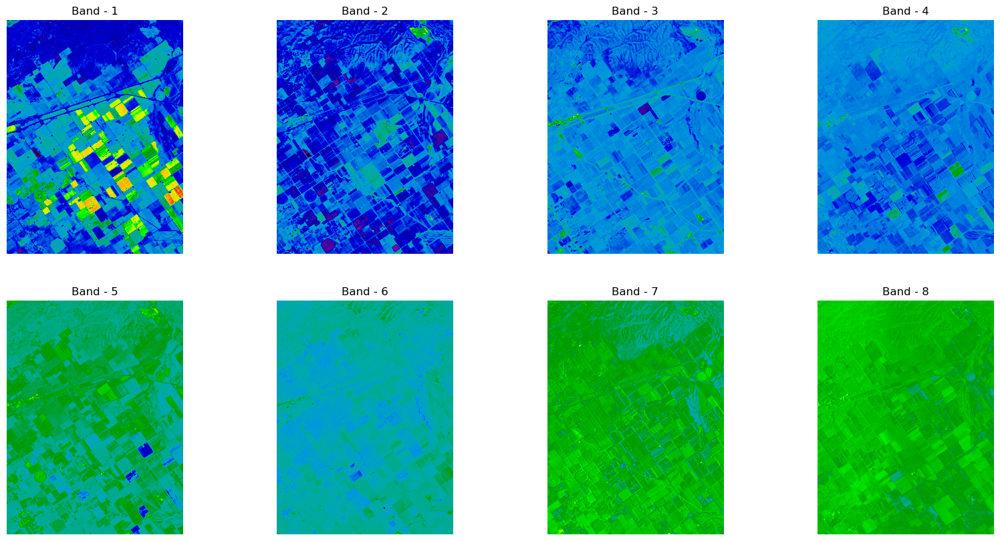

In [27]:
fig = plt.figure(figsize = (20, 10))

for i in range(1, 1+8):
    fig.add_subplot(2,4, i)
    plt.imshow(q.loc[:, f'PC-{i}'].values.reshape(984, 740), cmap='nipy_spectral')
#获取名为q的DataFrame,选择q中的所有行和名为PC-i的列,并将其转换为一个二维数组。
    plt.axis('off')
    plt.title(f'Band - {i}')

plt.savefig('IP_PCA_Bands.png')

#这段代码使用Matplotlib库创建一个包含8个子图的图表，每个子图显示一个不同的波段图像。
#图表的大小设置为20x10英寸。代码将每个子图添加到2x4的网格中，并将对应波段的图像绘制在每个子图中。

In [28]:
# saving to .csv
q.to_csv('IP_40_PCA.csv', index=False)

## SVM

In [29]:
x = q[q['class'] != 0]
X = x.iloc[:, :-1].values
y = x.loc[:, 'class'].values 

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=11, stratify=y)
svm = SVC(C=100, kernel='rbf', cache_size=10*1024)
svm.fit(X_train, y_train)
ypred = svm.predict(X_test)

In [31]:
names = ['changed pixels','unchanged pixels']

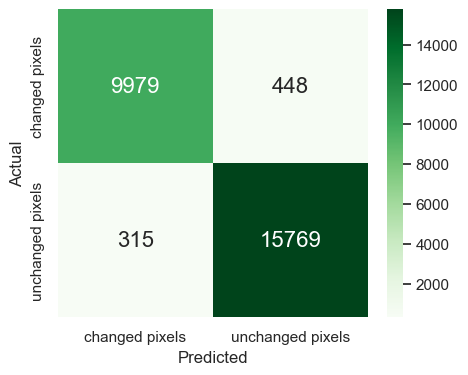

In [32]:
data = confusion_matrix(y_test, ypred)
df_cm = pd.DataFrame(data, columns=np.unique(names), index = np.unique(names))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'

plt.figure(figsize = (5,4))
sns.set(font_scale=1.0)#for label size
sns.heatmap(df_cm, cmap="Greens", annot=True,annot_kws={"size": 16}, fmt='d')

plt.savefig('cmap.png', dpi=300)

In [33]:
print(classification_report(y_test, ypred, target_names = names))

                  precision    recall  f1-score   support

  changed pixels       0.97      0.96      0.96     10427
unchanged pixels       0.97      0.98      0.98     16084

        accuracy                           0.97     26511
       macro avg       0.97      0.97      0.97     26511
    weighted avg       0.97      0.97      0.97     26511



In [34]:
# Classification Map
l = []
for i in range(len(q)):
    if q.iloc[i, -1] == 0:
        l.append(0)
    else:
        l.append(svm.predict(q.iloc[i, :-1].values.reshape(1, -1))[0])

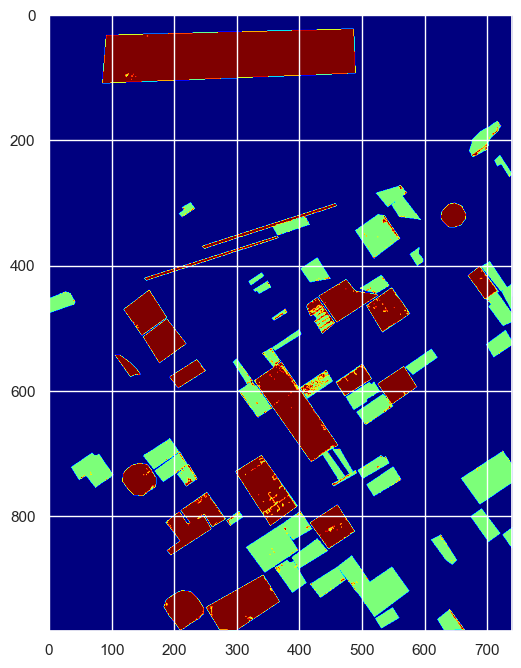

In [35]:
clmap = np.array(l).reshape(984, 740).astype('float')
plt.figure(figsize=(10, 8))
plt.imshow(clmap, cmap='jet')

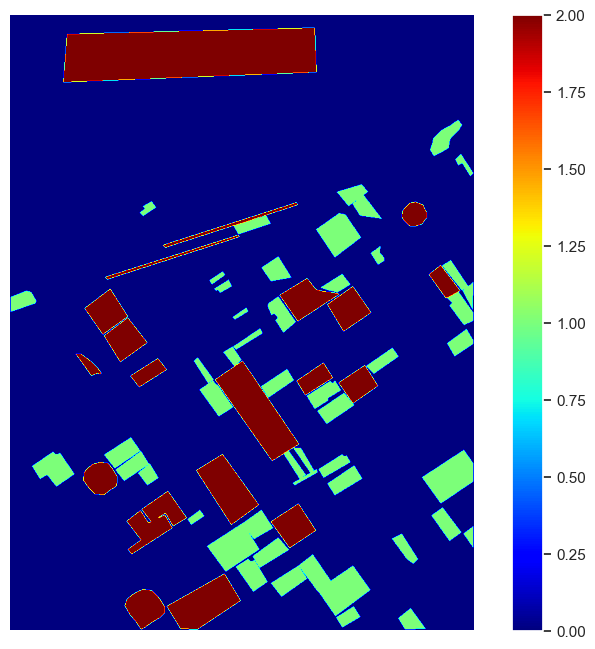

In [36]:
# 真实数据
y = barbara_gt

plt.figure(figsize=(10, 8))
plt.imshow(y, cmap='jet')
plt.colorbar()
plt.axis('off')
plt.savefig('IP_cmap.png')
plt.show()